In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("imsparsh/flowers-dataset")

print("Path to dataset files:", path)

Path to dataset files: C:\Users\rohit\.cache\kagglehub\datasets\imsparsh\flowers-dataset\versions\2


In [1]:
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np

In [2]:
path = 'C:\\Users\\rohit\\.cache\\kagglehub\\datasets\\imsparsh\\flowers-dataset\\versions\\2\\train\\daisy'

In [14]:
os.listdir(path)

['10140303196_b88d3d6cec.jpg',
 '10172379554_b296050f82_n.jpg',
 '10172567486_2748826a8b.jpg',
 '10172636503_21bededa75_n.jpg',
 '10391248763_1d16681106_n.jpg',
 '10437754174_22ec990b77_m.jpg',
 '10437770546_8bb6f7bdd3_m.jpg',
 '10437929963_bc13eebe0c.jpg',
 '10466290366_cc72e33532.jpg',
 '10466558316_a7198b87e2.jpg',
 '10555749515_13a12a026e.jpg',
 '10555815624_dc211569b0.jpg',
 '10555826524_423eb8bf71_n.jpg',
 '10559679065_50d2b16f6d.jpg',
 '10712722853_5632165b04.jpg',
 '10770585085_4742b9dac3_n.jpg',
 '10841136265_af473efc60.jpg',
 '10993710036_2033222c91.jpg',
 '10993818044_4c19b86c82.jpg',
 '10994032453_ac7f8d9e2e.jpg',
 '11023214096_b5b39fab08.jpg',
 '11023272144_fce94401f2_m.jpg',
 '11023277956_8980d53169_m.jpg',
 '11124324295_503f3a0804.jpg',
 '11439894966_dca877f0cd.jpg',
 '11834945233_a53b7a92ac_m.jpg',
 '11870378973_2ec1919f12.jpg',
 '11891885265_ccefec7284_n.jpg',
 '12193032636_b50ae7db35_n.jpg',
 '12348343085_d4c396e5b5_m.jpg',
 '12585131704_0f64b17059_m.jpg',
 '126012543

In [12]:
os.listdir(os.path.join(os.path.join(path, 'train'), 'daisy'))

FileNotFoundError: [WinError 3] The system cannot find the path specified: 'C:\\Users\\rohit\\.cache\\kagglehub\\datasets\\imsparsh\\flowers-dataset\\versions\\2\\train\\daisy\\train\\daisy'

In [7]:
p = os.path.join(os.path.join(os.path.join(path, 'train'), 'daisy'),'10140303196_b88d3d6cec.jpg')

In [8]:
img = cv2.imread(p)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

error: OpenCV(4.10.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


In [5]:
plt.imshow(img)

NameError: name 'img' is not defined

In [15]:
from sklearn.cluster import KMeans

In [21]:
help(KMeans)

Help on class KMeans in module sklearn.cluster._kmeans:

class KMeans(_BaseKMeans)
 |  KMeans(n_clusters=8, *, init='k-means++', n_init=10, max_iter=300, tol=0.0001, verbose=0, random_state=None, copy_x=True, algorithm='lloyd')
 |  
 |  K-Means clustering.
 |  
 |  Read more in the :ref:`User Guide <k_means>`.
 |  
 |  Parameters
 |  ----------
 |  
 |  n_clusters : int, default=8
 |      The number of clusters to form as well as the number of
 |      centroids to generate.
 |  
 |  init : {'k-means++', 'random'}, callable or array-like of shape             (n_clusters, n_features), default='k-means++'
 |      Method for initialization:
 |  
 |      'k-means++' : selects initial cluster centroids using sampling based on
 |      an empirical probability distribution of the points' contribution to the
 |      overall inertia. This technique speeds up convergence, and is
 |      theoretically proven to be :math:`\mathcal{O}(\log k)`-optimal.
 |      See the description of `n_init` for mor

In [64]:
k = KMeans(n_clusters=4)
labels = k.fit_predict(img.reshape(img.shape[0]*img.shape[1],img.shape[2]))

In [65]:
labels

array([0, 0, 0, ..., 1, 1, 1])

In [66]:
np.unique(labels)

array([0, 1, 2, 3])

In [67]:
k.cluster_centers_

array([[213.83635011, 214.28994722, 215.37460593],
       [139.88287152, 135.82693181, 126.69366914],
       [ 38.14103178,  37.08193579,  29.29955279],
       [183.6211846 , 146.16647078,   8.96295901]])

In [68]:
petal = k.cluster_centers_[0]

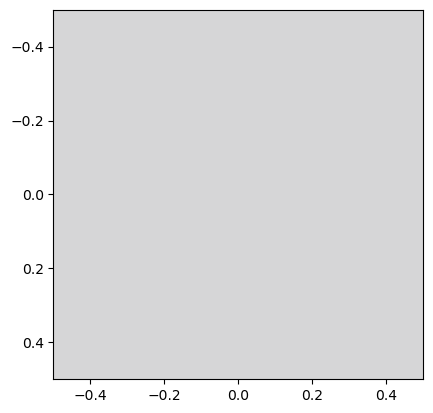

In [69]:
plt.imshow(petal.round(0).astype(int).reshape(1,1,3))

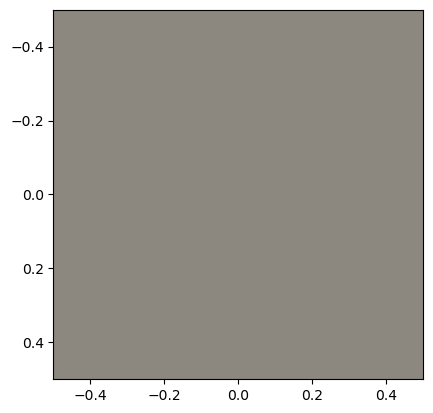

In [70]:
bg = k.cluster_centers_[1]
plt.imshow(bg.round(0).astype(int).reshape(1,1,3))

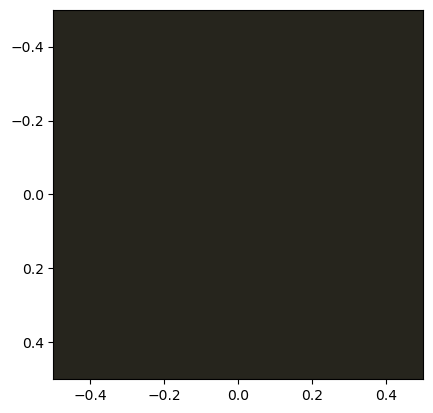

In [71]:
center = k.cluster_centers_[2]
plt.imshow(center.round(0).astype(int).reshape(1,1,3))

In [72]:
labels_temp = labels.copy()

In [73]:
img_clustered = k.cluster_centers_.round(0).astype(int)[labels_temp].reshape(img.shape)

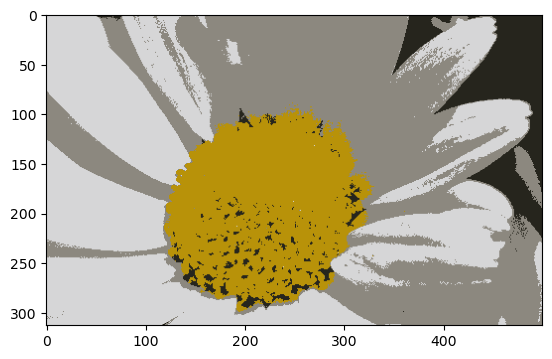

In [74]:
plt.imshow(img_clustered)

In [3]:
from keras.applications import VGG16

Using TensorFlow backend.


In [4]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import tensorflow as tf

In [6]:
len(os.listdir(path))

501

In [58]:
images = []
for img_path in os.listdir(path):
    if img_path.lower().endswith((".png", ".jpg", ".jpeg", ".gif", ".bmp")):
        img_path = os.path.join(path, img_path)
        img = load_img(img_path, target_size=(224, 224))
        images.append(img_to_array(img))
len(images)

501

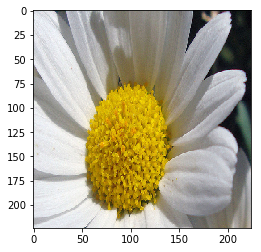

In [70]:
g = images[0]
def norm_clip_img(imgg):
    normalized = cv2.normalize(imgg, None, 0, 255, norm_type=cv2.NORM_MINMAX)
    img_ = np.clip(normalized, 0, 255).astype('uint8')
    plt.imshow(img_)
norm_clip_img(g)

In [72]:
## Preprocess
X = np.array(images)
X = tf.keras.applications.vgg16.preprocess_input(X)

In [69]:
X[0].shape

(224, 224, 3)

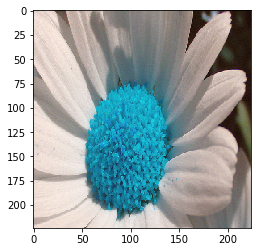

In [71]:
norm_clip_img(X[0])

In [74]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model

In [75]:
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224,224,3))

In [92]:
len(base_model.layers)

19

In [110]:
base_model.layers[2].get_weights()[0].shape

(3, 3, 3, 64)

In [79]:
base_model.layers[0].trainable

True

In [80]:
# freeze the layers
for layer in base_model.layers:
    layer.trainable = False

In [81]:
# Transfer learning
model = Model(inputs=base_model.input, 
              outputs=tf.keras.layers.GlobalAveragePooling2D()(base_model.output))

In [100]:
X.shape

(501, 224, 224, 3)

In [82]:
# Extract features
features = model.predict(X)
print(f"Feature shape: {features.shape}") # Should be (n_samples, 512)

Feature shape: (501, 512)


In [85]:
features

array([[0.3231795 , 0.        , 0.73130524, ..., 0.10332838, 0.7250287 ,
        0.57911897],
       [0.32639706, 0.        , 0.73452276, ..., 0.10332838, 0.7126198 ,
        0.5667101 ],
       [0.40715098, 0.        , 0.8152766 , ..., 0.17713228, 0.80202687,
        0.6561172 ],
       ...,
       [0.40715098, 0.        , 0.8152766 , ..., 0.17713228, 0.80202687,
        0.6561172 ],
       [0.3653949 , 0.        , 0.7735206 , ..., 0.18794653, 0.81284106,
        0.6669314 ],
       [0.3231795 , 0.        , 0.73130524, ..., 0.270388  , 0.90404433,
        0.74536383]], dtype=float32)

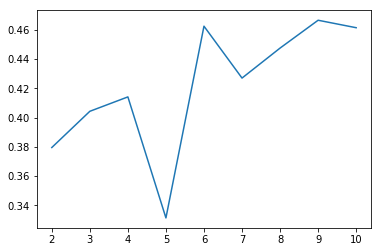

In [122]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

silhoutte_scores = []

for k_value in range(2,11):
    kmeans = KMeans(n_clusters=k_value, random_state=101, n_init=10)
    clusters = kmeans.fit_predict(features)
    silhoutte_scores.append(silhouette_score(features, clusters))

plt.plot(range(2,11), silhoutte_scores)

In [123]:
kmeans = KMeans(n_clusters=9, random_state=101, n_init=10)
clusters = kmeans.fit_predict(features)

In [125]:
np.unique(clusters)

array([0, 1, 2, 3, 4, 5, 6, 7, 8])

In [127]:
clusters.shape

(501,)

In [130]:
clusters

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 5, 0, 0, 0, 5, 0, 0,
       0, 5, 0, 0, 0, 5, 0, 0, 0, 5, 0, 0, 0, 5, 0, 0, 0, 5, 0, 0, 5, 5,
       0, 5, 5, 5, 0, 0, 5, 5, 0, 5, 5, 5, 0, 0, 5, 5, 0, 5, 5, 5, 0, 0,
       5, 5, 0, 5, 5, 5, 5, 0, 5, 5, 5, 5, 5, 5, 5, 0, 5, 5, 5, 5, 5, 5,
       5, 0, 5, 5, 5, 5, 5, 5, 5, 0, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 4, 7, 5, 2, 4, 6, 5, 5, 4, 7, 5, 2, 4, 6, 5, 5, 4, 7,
       5, 2, 4, 6, 5, 5, 4, 7, 5, 2, 4, 6, 5, 5, 4, 7, 8, 2, 4, 6, 3, 1,
       4, 7, 8, 2, 4, 6, 3, 1, 4, 7, 8, 2, 4, 6, 3, 1, 4, 7, 8, 2, 4, 6,
       3, 1, 4, 7, 8, 2, 4, 6, 3, 1, 4, 7, 8, 2, 4,

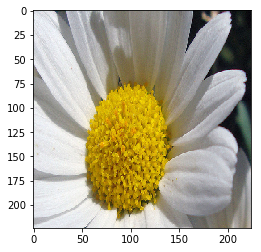

In [134]:
norm_clip_img(images[0])

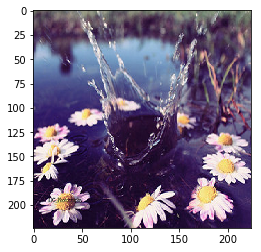

In [133]:
norm_clip_img(images[1])

In [136]:
indices = np.where(clusters == 5)

In [142]:
indices

(array([ 99, 103, 107, 111, 115, 119, 123, 127, 130, 131, 133, 134, 135,
        138, 139, 141, 142, 143, 146, 147, 149, 150, 151, 154, 155, 157,
        158, 159, 160, 162, 163, 164, 165, 166, 167, 168, 170, 171, 172,
        173, 174, 175, 176, 178, 179, 180, 181, 182, 183, 184, 186, 187,
        188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200,
        201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213,
        214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 226, 230, 231,
        234, 238, 239, 242, 246, 247, 250, 254, 255], dtype=int64),)

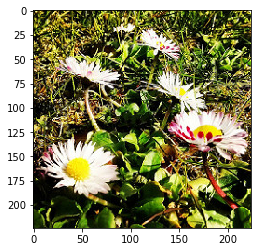

In [141]:
norm_clip_img(images[indices[0][0]])

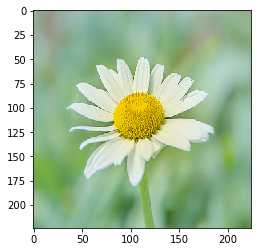

In [143]:
norm_clip_img(images[indices[0][1]])

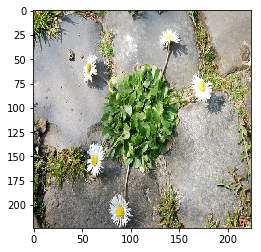

In [144]:
norm_clip_img(images[indices[0][2]])

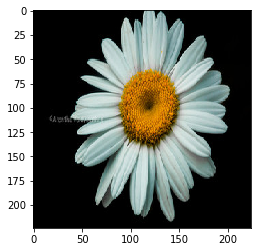

In [145]:
norm_clip_img(images[indices[0][3]])

## Different Approach

In [146]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.models import Model
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import cv2
from PIL import Image
import os

def load_and_preprocess_image(image_path, target_size=(224, 224)):
    """Load and preprocess a flower image for VGG16."""
    # Load original image for display
    original_img = Image.open(image_path).convert('RGB')
    original_img_array = np.array(original_img)
    
    # Preprocess for VGG16
    img = original_img.resize(target_size)
    img_array = np.array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    
    return img_array, original_img_array

def create_feature_extractor(layer_names=['block1_conv2', 'block3_conv3', 'block5_conv3']):
    """Create a VGG16-based feature extractor for multiple layers."""
    base_model = VGG16(weights='imagenet', include_top=False)
    outputs = [base_model.get_layer(name).output for name in layer_names]
    model = Model(inputs=base_model.input, outputs=outputs)
    return model


In [170]:
def extract_and_process_features(model, preprocessed_img, original_shape):
    """Extract and resize features from multiple VGG16 layers."""
    # Get feature maps from multiple layers
    feature_maps_list = model.predict(preprocessed_img)
    
    # Process each layer's feature maps
    all_features = []
    
    for feature_maps in feature_maps_list:
        # Get dimensions
        _, h, w, c = feature_maps.shape
        
        # Resize feature maps to original image dimensions
        resized_features = np.zeros((original_shape[0], original_shape[1], c))
        
        for i in range(c):
            channel = feature_maps[0, :, :, i]
            resized_channel = cv2.resize(channel, (original_shape[1], original_shape[0]))
            resized_features[:, :, i] = resized_channel
        
        # Reshape for feature stacking: (pixels, features)
        pixels = original_shape[0] * original_shape[1]
        resized_features_flat = resized_features.reshape((pixels, c))
        
        all_features.append(resized_features_flat)
    
    # Concatenate all features
    features_for_clustering = np.concatenate(all_features, axis=1)
    
    return features_for_clustering

def apply_kmeans_clustering(features, n_clusters=8, use_pca=True, pca_components=50):
    """Apply K-means clustering to VGG16 features with optional PCA."""
    # Standardize features
    scaler = StandardScaler()
    normalized_features = scaler.fit_transform(features)
    
    # Apply PCA for dimensionality reduction
    if use_pca and pca_components < normalized_features.shape[1]:
        pca = PCA(n_components=pca_components)
        normalized_features = pca.fit_transform(normalized_features)
        print(f"Reduced features from {features.shape[1]} to {pca_components} dimensions")
    
    # Apply K-means
    print(f"Applying K-means with {n_clusters} clusters...")
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(normalized_features)
    return cluster_labels, kmeans.cluster_centers_


In [153]:
img_path = os.path.join(path ,os.listdir(path)[0])

In [156]:
img_array, original_img_array = load_and_preprocess_image(img_path, target_size=(224, 224))

In [161]:
original_img_array.shape

(313, 500, 3)

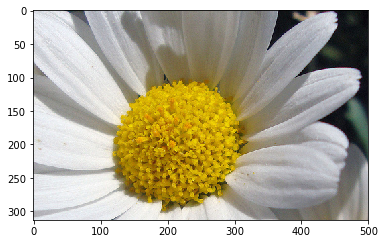

In [162]:
plt.imshow(original_img_array)

In [157]:
model = create_feature_extractor(layer_names=['block1_conv2', 'block3_conv3', 'block5_conv3'])

In [160]:
len(model.layers)

18

In [164]:
features = extract_and_process_features(model, img_array, original_img_array.shape)

In [166]:
features.shape

(156500, 832)

In [201]:
clusters, centers = apply_kmeans_clustering(features, n_clusters=3, use_pca=True, pca_components=50)

Reduced features from 832 to 50 dimensions
Applying K-means with 3 clusters...


In [204]:
np.unique(clusters)

array([0, 1, 2])

In [205]:
len(centers[0])

50

In [206]:
cluster_arr = clusters.reshape(original_img_array.shape[:2])

In [207]:
clr_codes = np.array([[213.83635011, 214.28994722, 215.37460593],
       [139.88287152, 135.82693181, 126.69366914],
       [ 38.14103178,  37.08193579,  29.29955279]])

In [208]:
clr_codes = clr_codes.astype('uint8')

In [209]:
clr_codes[0]

array([213, 214, 215], dtype=uint8)

In [210]:
img = clr_codes.astype('uint8')[clusters].reshape(original_img_array.shape)

In [211]:
img.shape

(313, 500, 3)

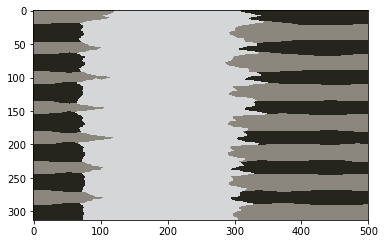

In [212]:
plt.imshow(img)

In [213]:
def create_and_visualize_segmentation(original_img, labels, original_shape, n_clusters):
    """Create a segmentation mask and visualize results."""
    # Reshape labels to create the mask
    mask = labels.reshape((original_shape[0], original_shape[1]))
    
    # Visualize
    plt.figure(figsize=(15, 7))
    
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='nipy_spectral')
    plt.title(f'Pixel-level Segmentation (K={n_clusters})')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return mask


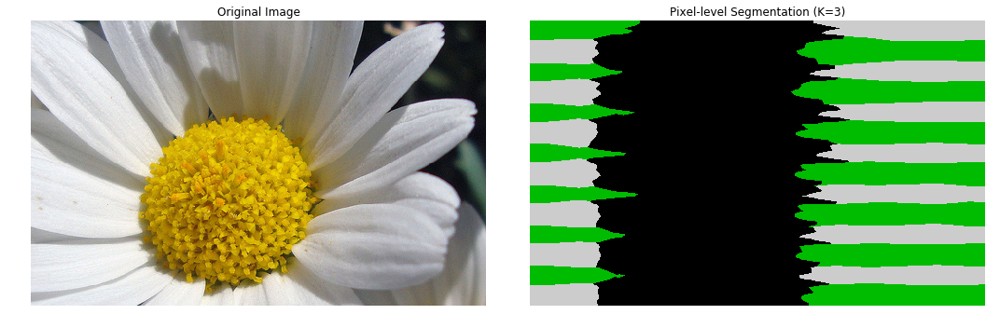

array([[1, 1, 1, ..., 2, 2, 2],
       [1, 1, 1, ..., 2, 2, 2],
       [1, 1, 1, ..., 2, 2, 2],
       ...,
       [2, 2, 2, ..., 1, 1, 1],
       [2, 2, 2, ..., 1, 1, 1],
       [2, 2, 2, ..., 1, 1, 1]])

In [215]:
create_and_visualize_segmentation(original_img_array, clusters, original_img_array.shape, 3)

## Another approach

In [4]:
import numpy as np
import cv2
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from skimage.segmentation import mark_boundaries
from skimage import color

def segment_flower(image_path, n_clusters=5):
    # 1. Load and prepare image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img, (224, 224))
    img_array = np.expand_dims(img_resized, axis=0)
    img_array = preprocess_input(img_array)
    
    # 2. Extract multiple types of features
    # 2a. Color features (HSV is better for flower segmentation)
    hsv_img = cv2.cvtColor(img_resized, cv2.COLOR_RGB2HSV)
    lab_img = cv2.cvtColor(img_resized, cv2.COLOR_RGB2LAB)
    
    # 2b. Deep features from different VGG16 layers
    base_model = VGG16(weights='imagenet', include_top=False)
    # Get earlier layer for better spatial resolution
    feature_model = Model(inputs=base_model.input, 
                         outputs=[base_model.get_layer('block3_conv3').output])
    deep_features = feature_model.predict(img_array)[0]
    
    # 3. Prepare feature vectors
    h, w, _ = img_resized.shape
    deep_features_resized = np.zeros((h, w, deep_features.shape[2]))
    
    # Carefully resize deep features to match image
    for i in range(deep_features.shape[2]):
        f = deep_features[:, :, i]
        f_resized = cv2.resize(f, (w, h))
        # Normalize to [0,1]
        f_resized = (f_resized - f_resized.min()) / (f_resized.max() - f_resized.min() + 1e-8)
        deep_features_resized[:, :, i] = f_resized
    
    # Combine color and deep features
    # Use principal components of deep features (first 10)
    from sklearn.decomposition import PCA
    deep_features_flat = deep_features_resized.reshape(-1, deep_features_resized.shape[2])
    pca = PCA(n_components=10)
    deep_features_pca = pca.fit_transform(deep_features_flat)
    deep_features_pca = deep_features_pca.reshape(h, w, 10)
    
    # Create feature vector combining color and deep features
    feature_vector = np.concatenate([
        hsv_img,                 # Color information (crucial for flowers)
        lab_img,                 # Alternative color space
        deep_features_pca[:,:,:3]  # Top 3 components of deep features
    ], axis=2)
    
    # 4. Reshape for clustering
    pixels = feature_vector.reshape(-1, feature_vector.shape[2])
    
    # 5. Improved K-means initialization using k-means++
    # Setting random_state ensures reproducibility
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', 
                   n_init=10, random_state=42)
    labels = kmeans.fit_predict(pixels)
    
    # 6. Reshape labels to image dimensions
    segmented = labels.reshape(h, w)
    
    # 7. Post-processing for smoother regions
    # Apply median filter to remove salt-and-pepper noise
    segmented = cv2.medianBlur(segmented.astype(np.uint8), 5)
    
    # 8. Optional: Clean small regions (remove objects smaller than 100 pixels)
    from skimage import morphology
    cleaned_mask = morphology.remove_small_objects(
        morphology.remove_small_holes(segmented == 1, 100), 100)
    
    # 9. Visualization
    plt.figure(figsize=(15, 10))
    
    plt.subplot(2, 2, 1)
    plt.imshow(img_resized)
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(2, 2, 2)
    plt.imshow(segmented, cmap='nipy_spectral')
    plt.title('K-means Segmentation')
    plt.axis('off')
    
    plt.subplot(2, 2, 3)
    plt.imshow(mark_boundaries(img_resized, segmented))
    plt.title('Segmentation Boundaries')
    plt.axis('off')
    
    # Create color-mapped segmentation
    from matplotlib import cm
    colored_segmentation = cm.nipy_spectral(segmented.astype(float)/n_clusters)[:,:,:3]
    
    plt.subplot(2, 2, 4)
    # Blend original with segmentation
    blend = 0.7 * img_resized/255 + 0.3 * colored_segmentation
    plt.imshow(blend)
    plt.title('Blended Segmentation')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return segmented, deep_features

# Usage:
# segmentation, features = segment_flower('path/to/flower.jpg', n_clusters=5)


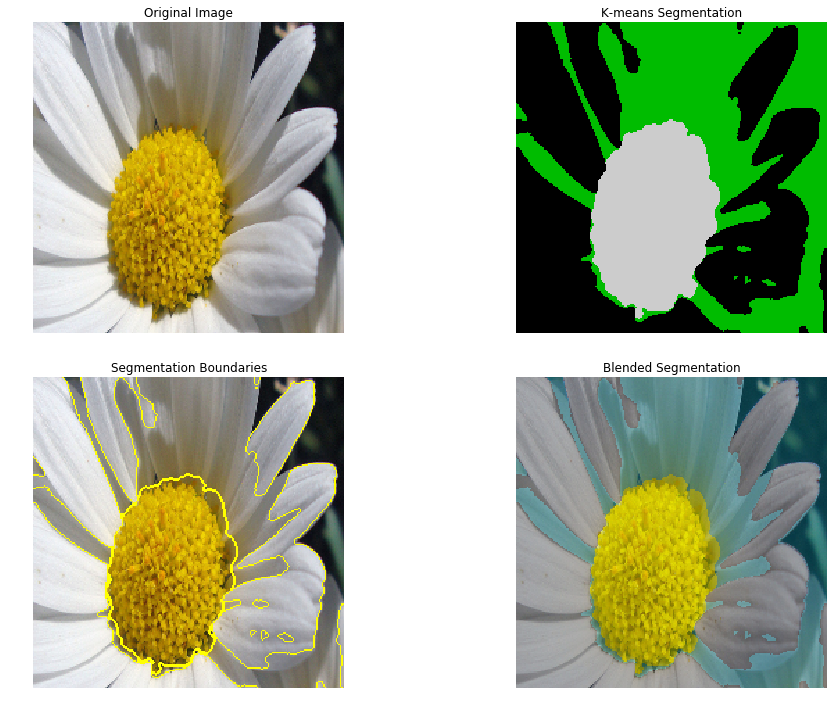

(array([[0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 1, 0, 0]], dtype=uint8),
 array([[[0.03541524, 0.10791802, 0.1176722 , ..., 0.0024724 ,
          0.00599405, 0.        ],
         [0.03541524, 0.10791802, 0.1176722 , ..., 0.0024724 ,
          0.00599405, 0.        ],
         [0.03541524, 0.10791802, 0.1176722 , ..., 0.0024724 ,
          0.00599405, 0.        ],
         ...,
         [0.03541524, 0.10791802, 0.1176722 , ..., 0.0024724 ,
          0.00599405, 0.        ],
         [0.03541524, 0.10791802, 0.1176722 , ..., 0.0024724 ,
          0.00599405, 0.        ],
         [0.03541524, 0.10791802, 0.1176722 , ..., 0.0024724 ,
          0.00599405, 0.        ]],
 
        [[0.03541524, 0.10791802, 0.1176722 , ..., 0.0024724 ,
          0.00599405, 0.        ],
         [0.03541524, 0.10791802, 0.1176722 , ..., 0.0024724 ,
        

In [220]:
segment_flower(img_path, n_clusters=3)

In [4]:
import numpy as np
import cv2
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from skimage.segmentation import mark_boundaries
from skimage import color
from tensorflow.keras import backend as K
import tensorflow as tf
import random

tf.random.set_seed(101)
np.random.seed(101)
K.clear_session()
img_path = os.path.join(path ,os.listdir(path)[0])
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_resized = cv2.resize(img, (224, 224))
img_array = np.expand_dims(img_resized, axis=0)
img_array = preprocess_input(img_array)
    
    # 2. Extract multiple types of features
    # 2a. Color features (HSV is better for flower segmentation)
hsv_img = cv2.cvtColor(img_resized, cv2.COLOR_RGB2HSV)
lab_img = cv2.cvtColor(img_resized, cv2.COLOR_RGB2LAB)
    
    # 2b. Deep features from different VGG16 layers
base_model = VGG16(weights='imagenet', include_top=False)
    # Get earlier layer for better spatial resolution
feature_model = Model(inputs=base_model.input, 
                         outputs=[base_model.get_layer('block3_conv3').output])
feature_model_predicted = feature_model.predict(img_array)
print(feature_model_predicted, feature_model_predicted.shape)
print(feature_model_predicted[0], feature_model_predicted[0].shape)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step
[[[[ 128.67996     -0.          -0.        ...  592.10284
      -0.          -0.       ]
   [  -0.          -0.          -0.        ...   -0.
      -0.          -0.       ]
   [  76.827675    -0.          -0.        ...   -0.
      -0.         103.08152  ]
   ...
   [  -0.          -0.          -0.        ...   -0.
      -0.          -0.       ]
   [  -0.          -0.          -0.        ...   -0.
      -0.          -0.       ]
   [  -0.          -0.          -0.        ... 1210.7103
      -0.          -0.       ]]

  [[  -0.         584.1147      -0.        ...  558.1693
      -0.          -0.       ]
   [  -0.         112.0993      -0.        ...   -0.
      -0.          -0.       ]
   [  -0.         222.85103     -0.        ...   -0.
      -0.          -0.       ]
   ...
   [  -0.         621.4044      -0.        ...   -0.
      -0.          -0.       ]
   [  -0.          -0.          -0.        ...   -0.
      -0.          -0.       ]
   [  -

In [5]:
deep_features = feature_model_predicted[0]

In [6]:
deep_features.shape

(56, 56, 256)

In [7]:
# 3. Prepare feature vectors
h, w, _ = img_resized.shape
deep_features_resized = np.zeros((h, w, deep_features.shape[2]))
deep_features_resized.shape

(224, 224, 256)

In [8]:
# Carefully resize deep features to match image
for i in range(deep_features.shape[2]):
    f = deep_features[:, :, i]
    f_resized = cv2.resize(f, (w, h))
    # Normalize to [0,1]
    f_resized = (f_resized - f_resized.min()) / (f_resized.max() - f_resized.min() + 1e-8)
    deep_features_resized[:, :, i] = f_resized

167


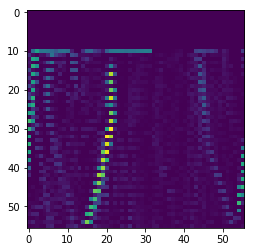

In [23]:
for i in range(256):
    feature_map = deep_features[:, :, i]
    if len(np.unique(feature_map)) > 1:
        plt.imshow(feature_map, cmap='viridis')
        print(i)
        break

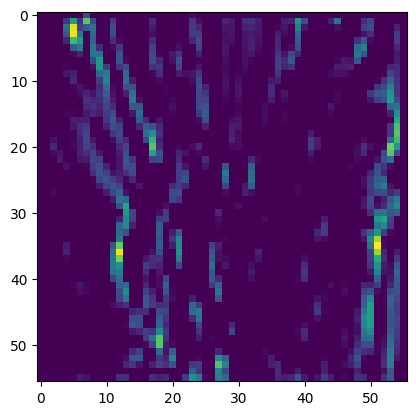

In [21]:
feature_map = deep_features[:, :, 167]
plt.imshow(feature_map, cmap='viridis')

In [31]:
import math
def view_features(deep_features):
    valid_features = []
    for i in range(deep_features.shape[2]):
        if len(np.unique(deep_features[:, :, i])) > 1:
            valid_features.append(deep_features[:, :, i])
    rows = math.ceil(len(valid_features)/10)
    print(rows)
    fig, axes = plt.subplots(nrows = rows, ncols = 10, figsize=(26, 26))
    k=0
    for i in range(rows):
        for j in range(10):
            if k < len(valid_features):
                feature_map = valid_features[k]
                axes[i][j].imshow(feature_map, cmap='viridis')
                k+=1

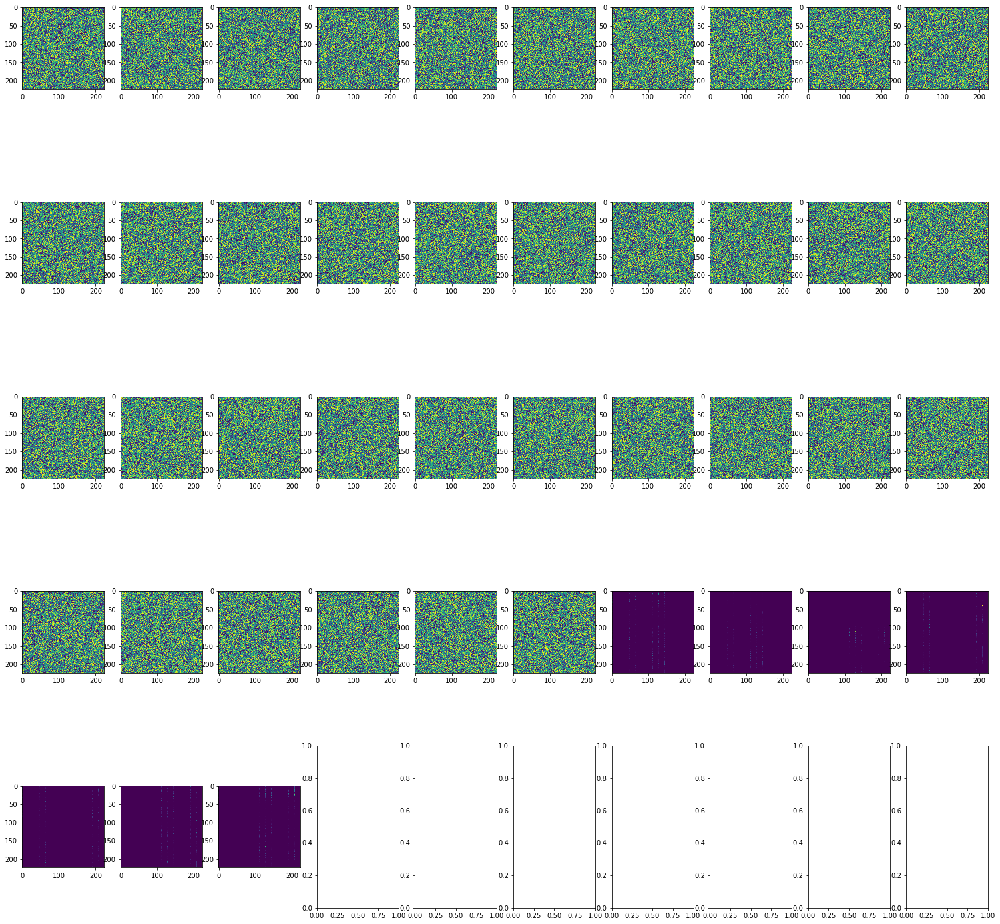

In [15]:
view_features(deep_features)

26


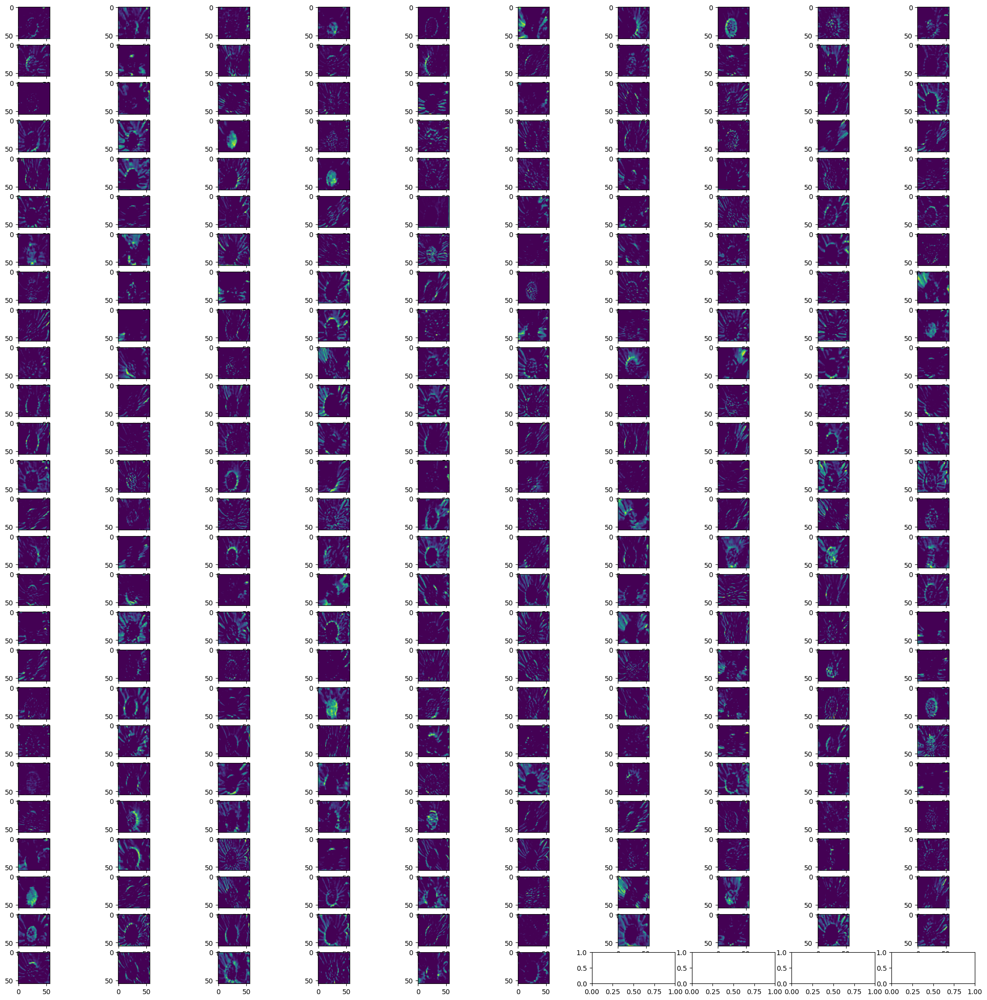

In [32]:
view_features(deep_features)

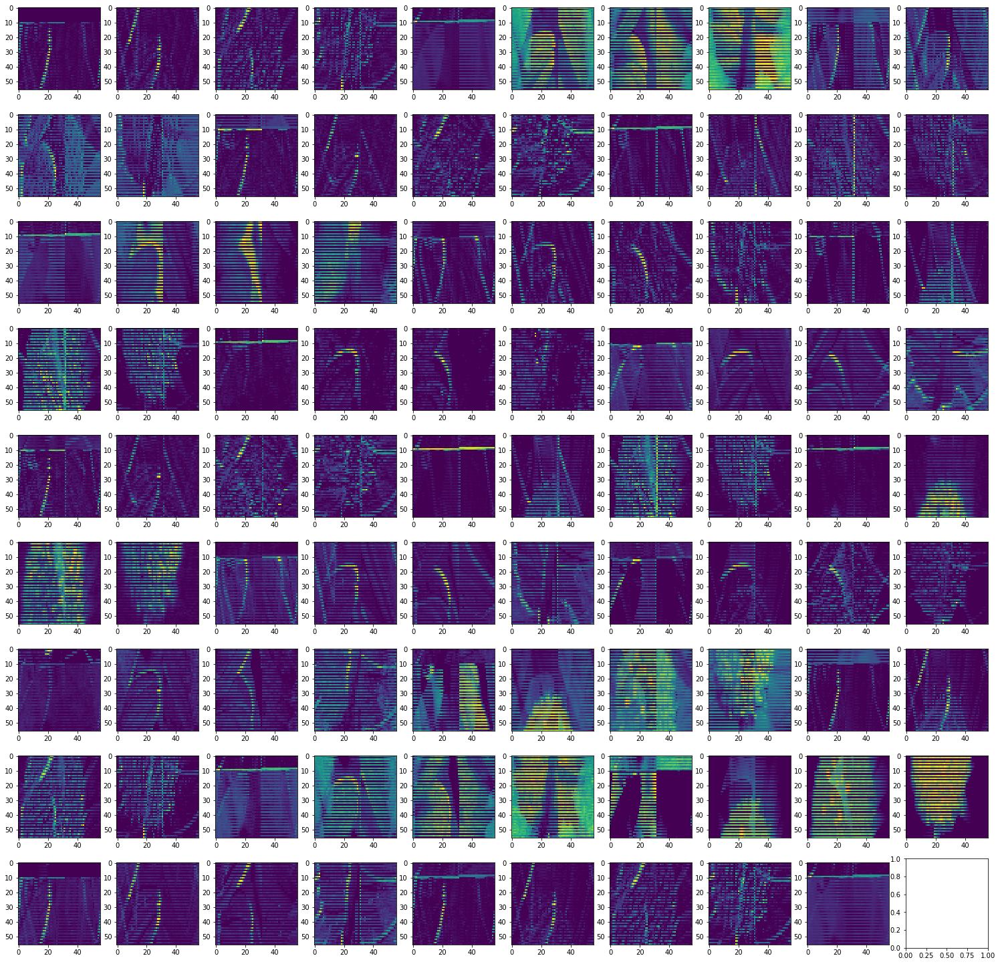

In [55]:
import math
valid_features = []
for i in range(deep_features.shape[2]):
    if len(np.unique(deep_features[:, :, i])) > 1:
        valid_features.append(deep_features[:, :, i])

rows = math.ceil(len(valid_features)/10)
fig, axes = plt.subplots(nrows = rows, ncols = 10, figsize=(26, 26))
k=0
for i in range(rows):
    for j in range(10):
        if k < len(valid_features):
            feature_map = valid_features[k]
            axes[i][j].imshow(feature_map, cmap='viridis')
            k+=1

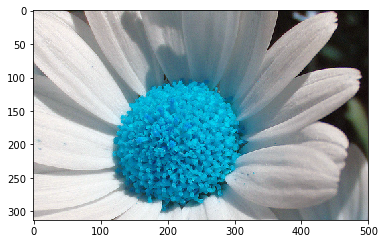

In [56]:
plt.imshow(cv2.imread(img_path))

## With fruits

In [63]:
p = os.path.join(os.path.join(os.getcwd(),'images'),'fruits.jpg')

In [64]:
mona = cv2.imread(p)
mona = cv2.cvtColor(mona, cv2.COLOR_BGR2RGB)

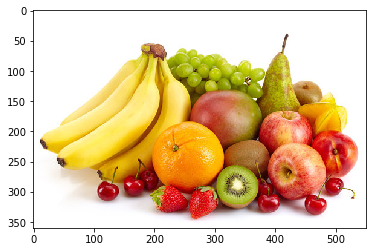

In [32]:
plt.imshow(mona)

In [33]:
mona.shape

(360, 551, 3)

In [39]:
mona_r = cv2.resize(mona,(224,224))

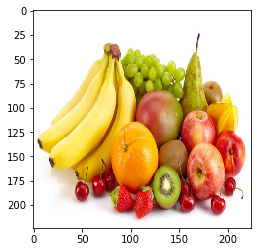

In [40]:
plt.imshow(mona_r)

In [44]:
mona_r.shape

(224, 224, 3)

In [41]:
from tensorflow.keras.applications.vgg16 import preprocess_input

# For single image
normalized_img = preprocess_input(mona_r)

In [46]:
normalized_img.shape

(224, 224, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


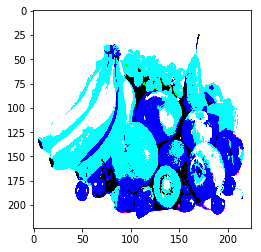

In [42]:
plt.imshow(normalized_img)

In [38]:
np.unique(normalized_img)


array([-1.1677900e+02, -1.1577900e+02, -1.1477900e+02, -1.1377900e+02,
       -1.1277900e+02, -1.1177900e+02, -1.1077900e+02, -1.0977900e+02,
       -1.0877900e+02, -1.0777900e+02, -1.0677900e+02, -1.0577900e+02,
       -1.0477900e+02, -1.0393900e+02, -1.0377900e+02, -1.0293900e+02,
       -1.0277900e+02, -1.0268000e+02, -1.0193900e+02, -1.0177900e+02,
       -1.0093900e+02, -1.0077900e+02, -1.0068000e+02, -9.9939003e+01,
       -9.9778999e+01, -9.8939003e+01, -9.8778999e+01, -9.7939003e+01,
       -9.7778999e+01, -9.6939003e+01, -9.6778999e+01, -9.6680000e+01,
       -9.5939003e+01, -9.5778999e+01, -9.4939003e+01, -9.4778999e+01,
       -9.3939003e+01, -9.3778999e+01, -9.2939003e+01, -9.2778999e+01,
       -9.2680000e+01, -9.1939003e+01, -9.1778999e+01, -9.1680000e+01,
       -9.0939003e+01, -9.0778999e+01, -8.9939003e+01, -8.9778999e+01,
       -8.9680000e+01, -8.8939003e+01, -8.8778999e+01, -8.7939003e+01,
       -8.7778999e+01, -8.7680000e+01, -8.6939003e+01, -8.6778999e+01,
      

In [43]:
from tensorflow.keras.applications import VGG16

base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224,224,3))



58892288/58889256 [==============================] - 1s 0us/step


In [45]:
base_model

In [69]:
processed_images = np.expand_dims(mona_r, axis=0)

In [70]:
features = base_model.predict(processed_images)

In [71]:
features.shape

(1, 7, 7, 512)

In [72]:
features = np.squeeze(features)  # Remove batch dimension -> (7, 7, 512)
h, w, c = features.shape
flattened_features = features.reshape(-1, c)

In [78]:
from sklearn.decomposition import PCA

# Preserve 95% of variance (adjust based on your data)
pca = PCA(n_components=0.95)
reduced_features = pca.fit_transform(flattened_features) 

In [79]:
from sklearn.cluster import KMeans

# Determine optimal clusters (for medical vs natural images)
k = 10  # Start with 3-5 for most segmentation tasks
kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10)
cluster_labels = kmeans.fit_predict(reduced_features)

C:\Users\rohit\anaconda3\envs\face_recognition_env\lib\site-packages\sklearn\cluster\_kmeans.py:1077: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  return self.fit(X, sample_weight=sample_weight).labels_


In [80]:
cluster_labels

array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0])

In [81]:
len(cluster_labels)

49

In [82]:
# Reshape to original feature map dimensions
seg_mask = cluster_labels.reshape(h, w)  # -> (7,7)

# Upscale to original image size (224x224)
import cv2
final_mask = cv2.resize(seg_mask.astype(float), (224, 224), 
                       interpolation=cv2.INTER_NEAREST)

In [83]:
final_mask = cv2.medianBlur(final_mask.astype(np.uint8), 5)

In [84]:
final_mask.shape

(224, 224)

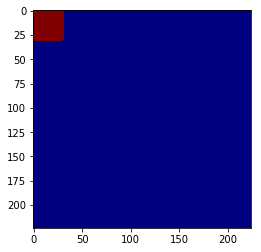

In [85]:
plt.imshow(final_mask, cmap='jet')

In [64]:
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np

In [6]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("happyharrycn/uw-madison-gi-tract-image-segmentation-dataset")

print("Path to dataset files:", path)

100%|██████████| 3.83G/3.83G [01:13<00:00, 55.7MB/s]

Extracting model files...


Path to dataset files: C:\Users\rohit\.cache\kagglehub\datasets\happyharrycn\uw-madison-gi-tract-image-segmentation-dataset\versions\1


In [21]:
import ants
import SimpleITK as sitk
from ipywidgets import interact

ModuleNotFoundError: No module named 'ipywidgets'

In [13]:
path = os.path.join(os.getcwd(), 'assets', 'fsl-open-dev_sub-001_T1w.nii.gz')

In [14]:
raw_img_ants = ants.image_read(path)

In [225]:
sitk.GetArrayFromImage(sitk.ReadImage(path)).shape

(192, 192, 160)

In [15]:
raw_img_ants

ANTsImage (LPI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (160, 192, 192)
	 Spacing    : (1.2, 1.25, 1.25)
	 Origin     : (98.1114, 89.5975, -129.5975)
	 Direction  : [-1.  0.  0.  0. -1.  0.  0.  0.  1.]

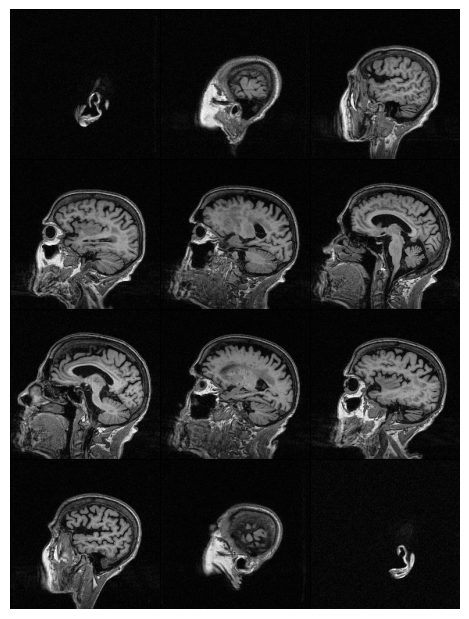

In [16]:
ants.plot(raw_img_ants)

In [18]:
raw_img_ants_np = raw_img_ants.numpy()

In [19]:
raw_img_ants_np.shape

(160, 192, 192)

In [20]:
raw_img_ants_np.shape[0]-1

159

In [22]:
SLICE = (0, 159)

In [59]:
img = raw_img_ants_np[51, :, :]

In [40]:
img.shape

(192, 192)

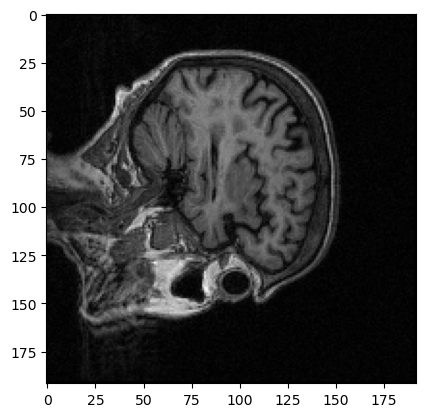

In [41]:
plt.imshow(img, cmap='gray')

In [49]:
denoised_ants = ants.denoise_image(raw_img_ants)

In [60]:
denoised_ants_img = denoised_ants.numpy()[51,:,:]

In [61]:
img = cv2.rotate(img, 2)
denoised_ants_img = cv2.rotate(denoised_ants_img, 2)

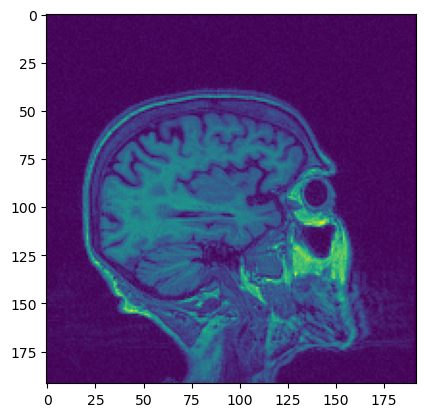

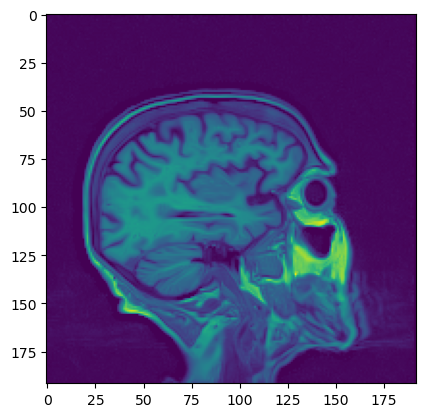

In [62]:
plt.imshow(img, cmap='viridis')
plt.show()
plt.imshow(denoised_ants_img, cmap='viridis')
plt.show()

In [113]:
morph = cv2.medianBlur(img,3)
morph_ = cv2.morphologyEx(img, cv2.MORPH_OPEN, np.ones((3,3),np.uint8))

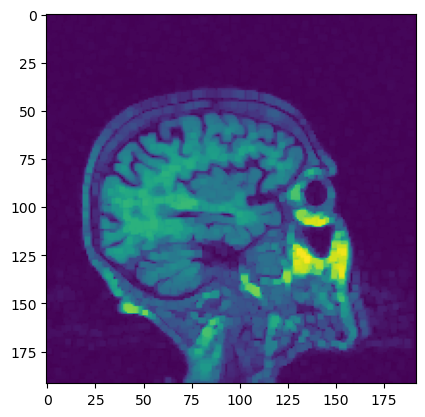

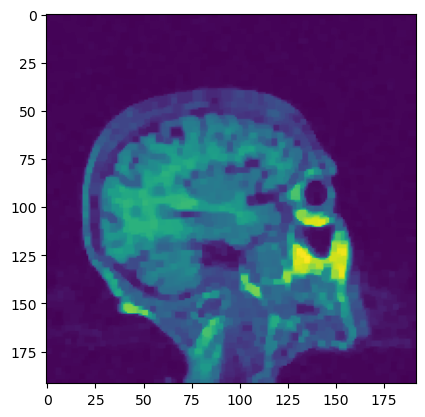

In [116]:
plt.imshow(morph_)
plt.show()
morph__ = cv2.morphologyEx(morph_, cv2.MORPH_CLOSE, np.ones((3,3),np.uint8))
plt.imshow(morph__)

In [149]:
normalized = cv2.normalize(img, None, 0, 255, norm_type=cv2.NORM_MINMAX)

img_ = np.clip(normalized, 0, 255).astype('uint8')

In [200]:
dst = cv2.fastNlMeansDenoising(img_, None, 9, 7, 21)

In [201]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (1,1))
opened = cv2.morphologyEx(dst, cv2.MORPH_OPEN, kernel)

''

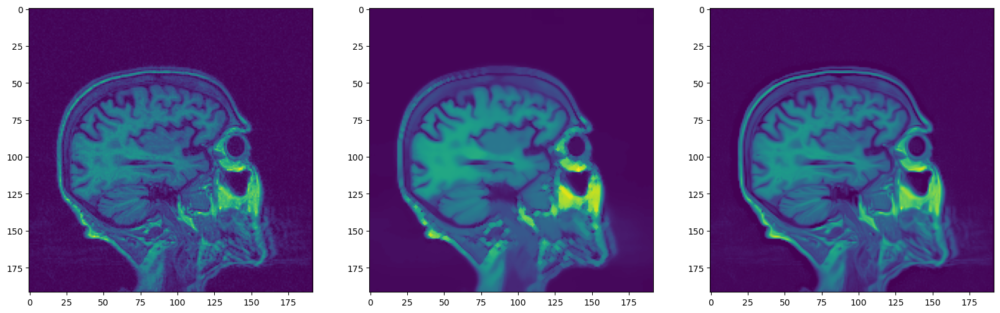

In [192]:
fig,axes = plt.subplots(nrows=1,ncols=3, figsize=(20,20))
axes[0].imshow(img)
axes[1].imshow(opened)
axes[2].imshow(denoised_ants_img)
;

''

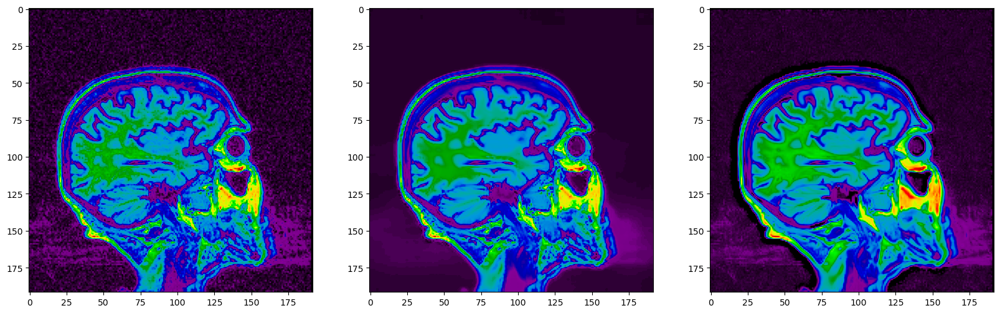

In [217]:
fig,axes = plt.subplots(nrows=1,ncols=3, figsize=(20,20))
axes[0].imshow(img,  cmap='nipy_spectral')
axes[1].imshow(opened, cmap='nipy_spectral')
axes[2].imshow(denoised_ants_img, cmap='nipy_spectral')
;

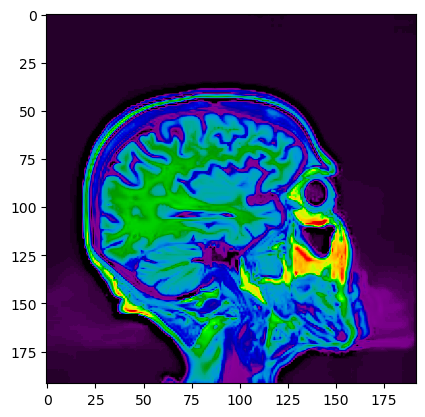

In [216]:
normalized = cv2.normalize(denoised_ants_img, None, 0, 255, norm_type=cv2.NORM_MINMAX)
img__ = np.clip(normalized, 0, 255).astype('uint8')
dst1 = cv2.fastNlMeansDenoising(img__, None, 3, 7, 21)
plt.imshow(dst1, cmap='nipy_spectral')

In [218]:
sitk_image1 = sitk.GetImageFromArray(img)

In [219]:
sitk_image1

<SimpleITK.SimpleITK.Image; proxy of <Swig Object of type 'std::vector< itk::simple::Image >::value_type *' at 0x000001BABC6DF300> >

In [226]:
sitk.GetArrayFromImage(sitk_image1).shape

(192, 192)

In [238]:
volume_np = np.stack([img, opened, denoised_ants_img], axis=0)

In [228]:
volume_np.shape

(2, 192, 192)

In [239]:
sitk_ = sitk.GetImageFromArray(volume_np)

In [240]:
arr = sitk.GetArrayFromImage(sitk_)

In [241]:
arr.shape

(3, 192, 192)

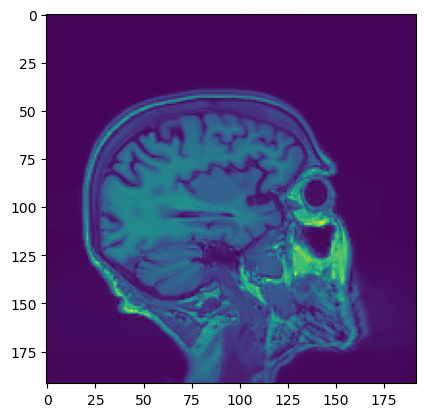

In [237]:
plt.imshow(arr[1,:,:])

In [242]:
transformed = sitk.RescaleIntensity(sitk_, 0, 255)
th = sitk.LiThreshold(transformed,0,1)
msk = th

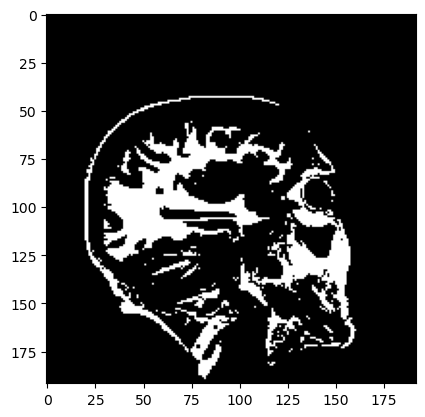

In [246]:
plt.imshow(sitk.GetArrayFromImage(msk)[1,:,:], cmap='gray')

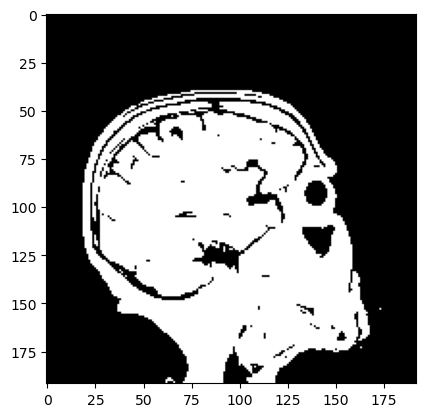

In [247]:
plt.imshow(sitk.GetArrayFromImage(msk)[2,:,:], cmap='gray')

In [267]:
# shrink_factor = 3
# input_image = sitk_
# input_image = sitk.Shrink(input_image, [shrink_factor]*input_image.GetDimension())
# msk_image = sitk.Shrink(msk, [shrink_factor]*msk.GetDimension())

In [268]:
sitk.GetArrayFromImage(input_image).shape

(1, 64, 64)

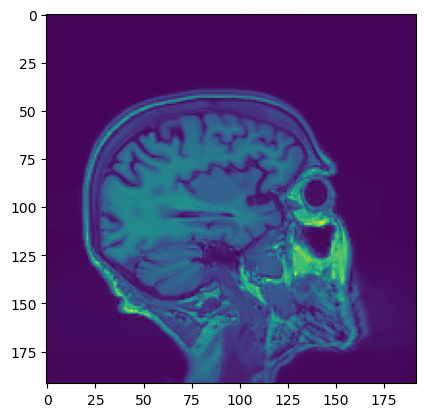

In [264]:
plt.imshow(sitk.GetArrayFromImage(input_image)[1,:,:])

In [269]:
biasCorrection = sitk.N4BiasFieldCorrectionImageFilter()

In [271]:
corrected = biasCorrection.Execute(sitk_, msk)

In [275]:
log_bias_field = biasCorrection.GetLogBiasFieldAsImage(sitk_)

In [276]:
corrected_image_full_res = sitk_/ sitk.Exp(log_bias_field) 

In [279]:
bci = sitk.GetArrayFromImage(corrected_image_full_res)[2,:,:]

''

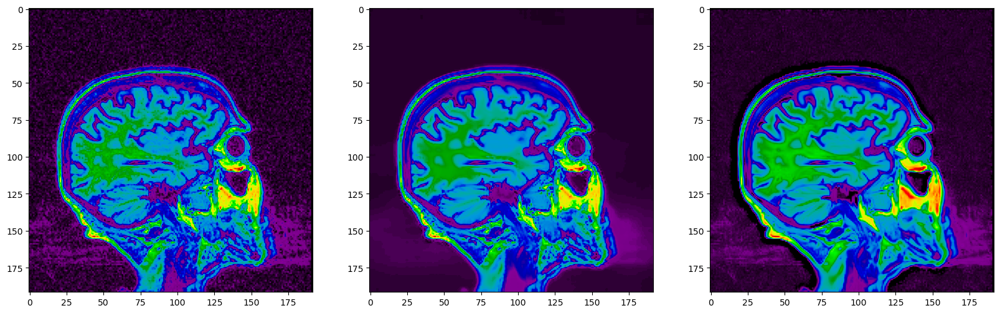

In [280]:
fig,axes = plt.subplots(nrows=1,ncols=3, figsize=(20,20))
axes[0].imshow(img,  cmap='nipy_spectral')
axes[1].imshow(opened, cmap='nipy_spectral')
axes[2].imshow(denoised_ants_img, cmap='nipy_spectral')
;

''

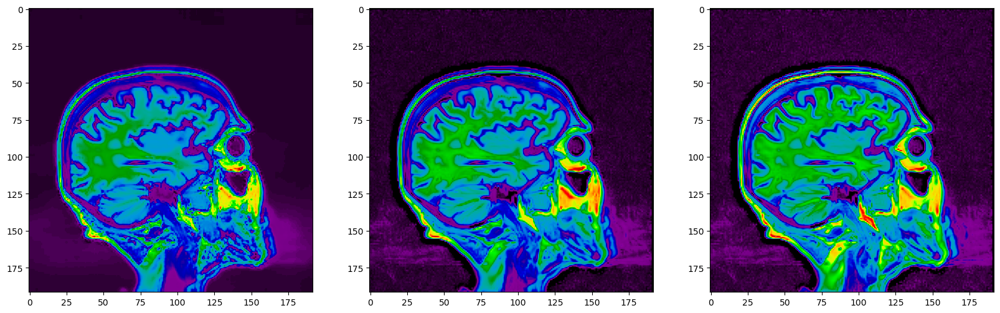

In [281]:
fig,axes = plt.subplots(nrows=1,ncols=3, figsize=(20,20))
axes[0].imshow(opened, cmap='nipy_spectral')
axes[1].imshow(denoised_ants_img, cmap='nipy_spectral')
axes[2].imshow(bci,  cmap='nipy_spectral')
;

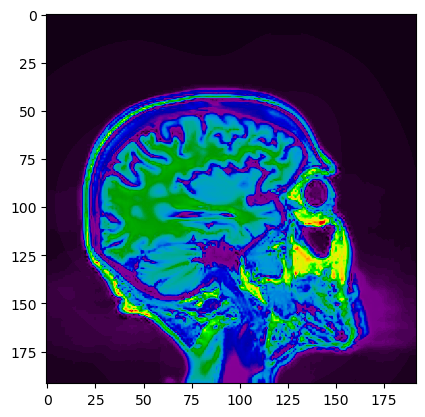

In [282]:
plt.imshow(sitk.GetArrayFromImage(corrected_image_full_res)[1,:,:],cmap='nipy_spectral')

In [291]:
path1 = os.path.join(os.getcwd(), 'assets', 's1.png')
path2 = os.path.join(os.getcwd(), 'assets', 's2.png')
path3 = os.path.join(os.getcwd(), 'assets', 's3.png')
s1 = cv2.imread(path1,0)
s2 = cv2.imread(path2,0)
s3 = cv2.imread(path3,0)

''

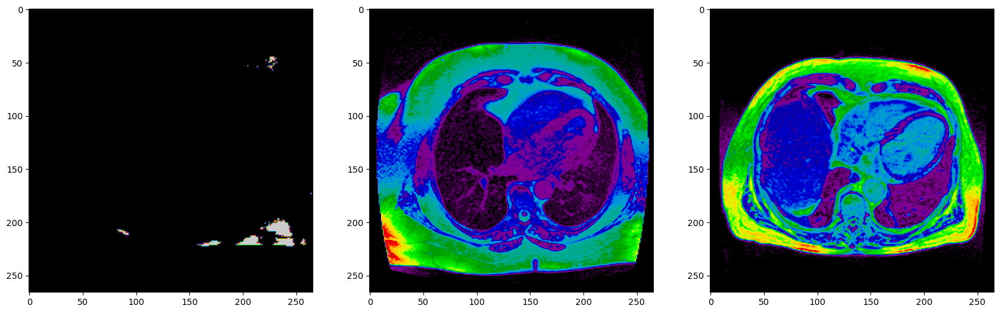

In [294]:
fig,axes = plt.subplots(nrows=1,ncols=3, figsize=(20,20))
axes[0].imshow(s1, cmap='nipy_spectral')
axes[1].imshow(s2, cmap='nipy_spectral')
axes[2].imshow(s3,  cmap='nipy_spectral')
;

In [296]:
def normalize_mri(img, window_center=50, window_width=400):
    img_min = window_center - window_width//2
    img_max = window_center + window_width//2
    return np.clip((img - img_min) / (img_max - img_min), 0, 1)

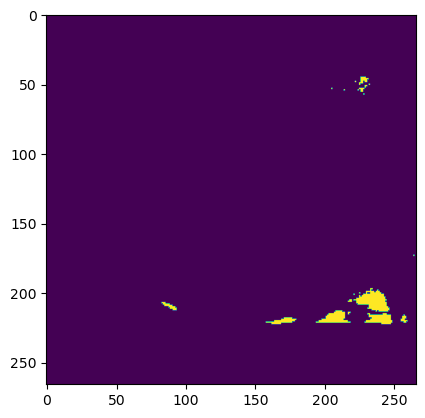

In [299]:
plt.imshow(normalize_mri(s1))

In [302]:
np.mean(s2), np.mean(s3)

(7.344267623947085, 7.7763016563966305)

In [ ]:
volume_np = np.stack([s2,s3], axis=0)
sitk_ = sitk.GetImageFromArray(volume_np)